# Explore data augmentations

This notebook will be used to test different data augmentation strategies. In your config file, you can modify the augmentations by adding `data_augmentation_options`. For example, I would like to add a random RGB to gray transform with a probability of 0.2:
```
data_augmentation_options {
    random_rgb_to_gray {
    probability: 0.2
    }
```

A complete list of augmentation is provided the [`preprocessor.proto` file of the Tf Object Detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/protos/preprocessor.proto).

### Helper functions

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle

In [4]:
def recenter_image(image):
    # ssd preprocessing
    image += [123.68, 116.779, 103.939]
    return image

def display_instances(image, bboxes, classes):
    image = recenter_image(image)
    w, h, _ = image.shape
    # resize the bboxes
    bboxes[:, [0, 2]] *= w
    bboxes[:, [1, 3]] *= h
    
    f, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image.astype(np.uint8))
    for bb, cl in zip(bboxes, classes):
        y1, x1, y2, x2 = bb
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor='r', linewidth=2)
        ax.add_patch(rec)
    plt.show()

def display_batch(batch):
    # get images, bboxes and classes
    batched_images = batch[0]['image'].numpy()
    batched_bboxes = batch[1]['groundtruth_boxes'].numpy()
    batched_classes = batch[1]['groundtruth_classes'].numpy()
    num_bboxes = batch[1]['num_groundtruth_boxes'].numpy()
    batch_size = batched_images.shape[0]
    for idx in range(batch_size):
        display_instances(batched_images[idx, ...], 
                          batched_bboxes[idx, :num_bboxes[idx], :],
                          batched_classes[idx, ...])

### Display augmentations

In [7]:
from utils import get_train_input

In [8]:
train_dataset_0 = get_train_input("experiments/experiment_0/pipeline_0.config")

INFO:tensorflow:Reading unweighted datasets: ['data/train/segment-11219370372259322863_5320_000_5340_000_with_camera_labels.tfrecord', 'data/train/segment-10498013744573185290_1240_000_1260_000_with_camera_labels.tfrecord', 'data/train/segment-11846396154240966170_3540_000_3560_000_with_camera_labels.tfrecord', 'data/train/segment-10770759614217273359_1465_000_1485_000_with_camera_labels.tfrecord', 'data/train/segment-11379226583756500423_6230_810_6250_810_with_camera_labels.tfrecord', 'data/train/segment-10876852935525353526_1640_000_1660_000_with_camera_labels.tfrecord', 'data/train/segment-11489533038039664633_4820_000_4840_000_with_camera_labels.tfrecord', 'data/train/segment-11113047206980595400_2560_000_2580_000_with_camera_labels.tfrecord', 'data/train/segment-11623618970700582562_2840_367_2860_367_with_camera_labels.tfrecord', 'data/train/segment-11017034898130016754_697_830_717_830_with_camera_labels.tfrecord', 'data/train/segment-11674150664140226235_680_000_700_000_with_came

INFO:tensorflow:Number of filenames to read: 85
Instructions for updating:
`seed2` arg is deprecated.Use sample_distorted_bounding_box_v2 instead.
Instructions for updating:
Use `tf.cast` instead.


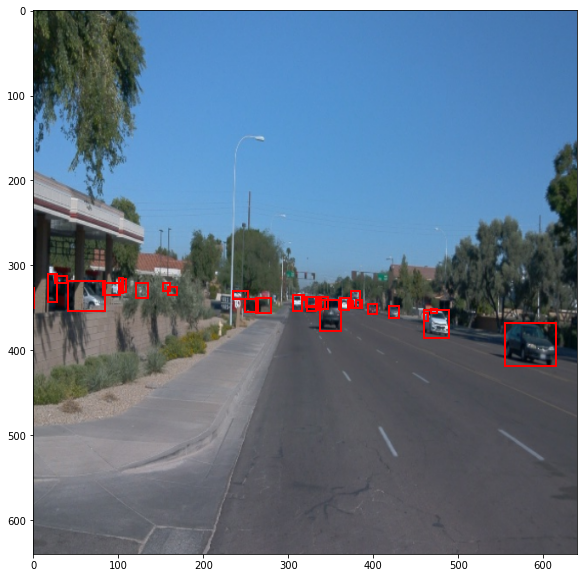

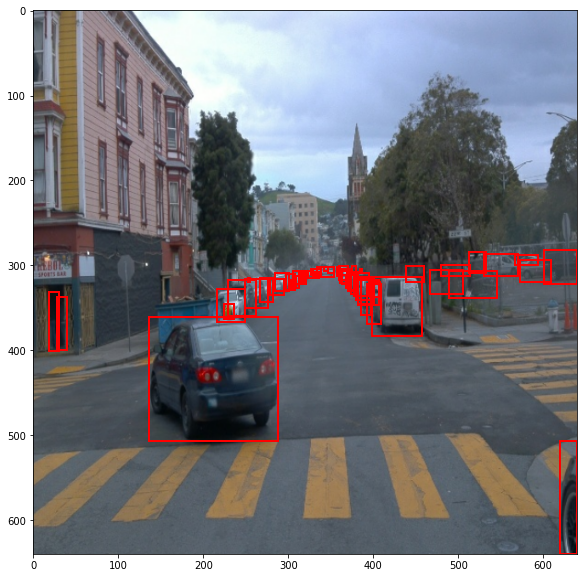

In [9]:
%matplotlib inline

for batch in train_dataset_0.take(1):
    display_batch(batch)

In [10]:
train_dataset_2 = get_train_input("experiments/experiment_2/pipeline_2.config")

INFO:tensorflow:Reading unweighted datasets: ['data/train/segment-11219370372259322863_5320_000_5340_000_with_camera_labels.tfrecord', 'data/train/segment-10498013744573185290_1240_000_1260_000_with_camera_labels.tfrecord', 'data/train/segment-11846396154240966170_3540_000_3560_000_with_camera_labels.tfrecord', 'data/train/segment-10770759614217273359_1465_000_1485_000_with_camera_labels.tfrecord', 'data/train/segment-11379226583756500423_6230_810_6250_810_with_camera_labels.tfrecord', 'data/train/segment-10876852935525353526_1640_000_1660_000_with_camera_labels.tfrecord', 'data/train/segment-11489533038039664633_4820_000_4840_000_with_camera_labels.tfrecord', 'data/train/segment-11113047206980595400_2560_000_2580_000_with_camera_labels.tfrecord', 'data/train/segment-11623618970700582562_2840_367_2860_367_with_camera_labels.tfrecord', 'data/train/segment-11017034898130016754_697_830_717_830_with_camera_labels.tfrecord', 'data/train/segment-11674150664140226235_680_000_700_000_with_came

INFO:tensorflow:Number of filenames to read: 85


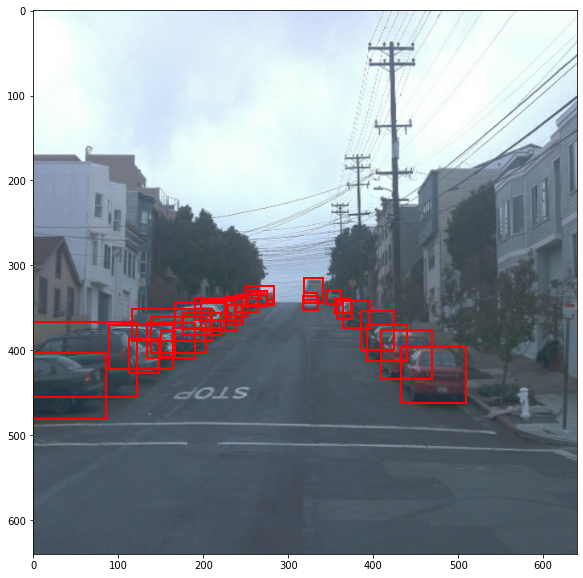

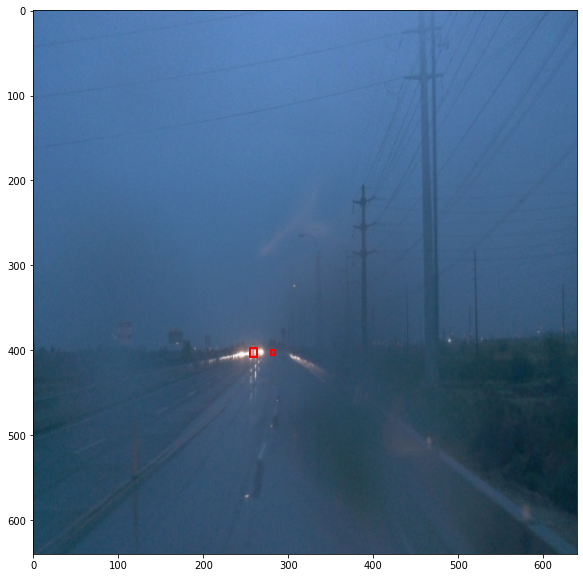

In [11]:
%matplotlib inline

for batch in train_dataset_2.take(1):
    display_batch(batch)

In [12]:
train_dataset_4 = get_train_input("experiments/experiment_4/pipeline_4.config")

INFO:tensorflow:Reading unweighted datasets: ['data/train/segment-11219370372259322863_5320_000_5340_000_with_camera_labels.tfrecord', 'data/train/segment-10498013744573185290_1240_000_1260_000_with_camera_labels.tfrecord', 'data/train/segment-11846396154240966170_3540_000_3560_000_with_camera_labels.tfrecord', 'data/train/segment-10770759614217273359_1465_000_1485_000_with_camera_labels.tfrecord', 'data/train/segment-11379226583756500423_6230_810_6250_810_with_camera_labels.tfrecord', 'data/train/segment-10876852935525353526_1640_000_1660_000_with_camera_labels.tfrecord', 'data/train/segment-11489533038039664633_4820_000_4840_000_with_camera_labels.tfrecord', 'data/train/segment-11113047206980595400_2560_000_2580_000_with_camera_labels.tfrecord', 'data/train/segment-11623618970700582562_2840_367_2860_367_with_camera_labels.tfrecord', 'data/train/segment-11017034898130016754_697_830_717_830_with_camera_labels.tfrecord', 'data/train/segment-11674150664140226235_680_000_700_000_with_came

INFO:tensorflow:Number of filenames to read: 85


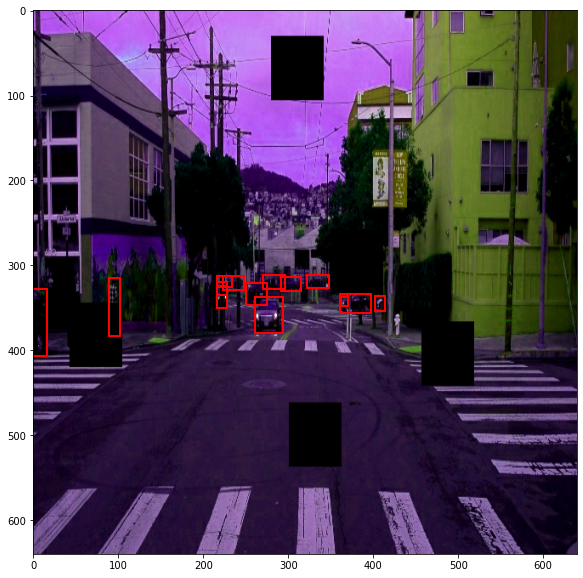

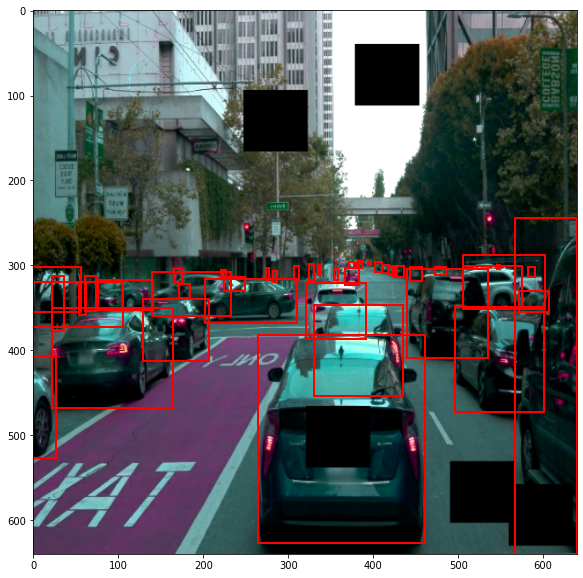

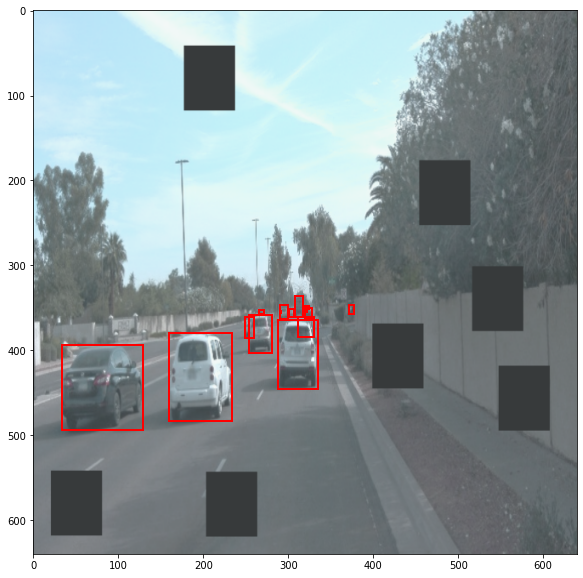

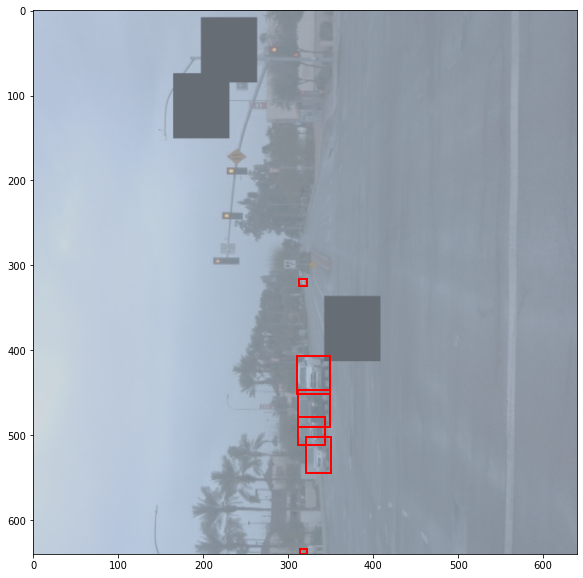

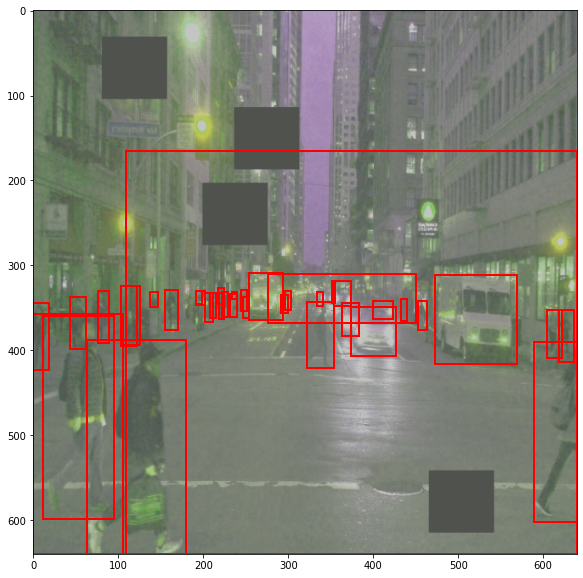

...

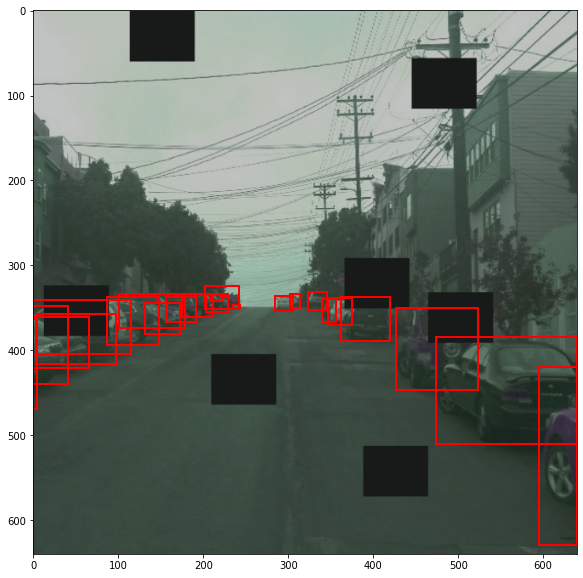

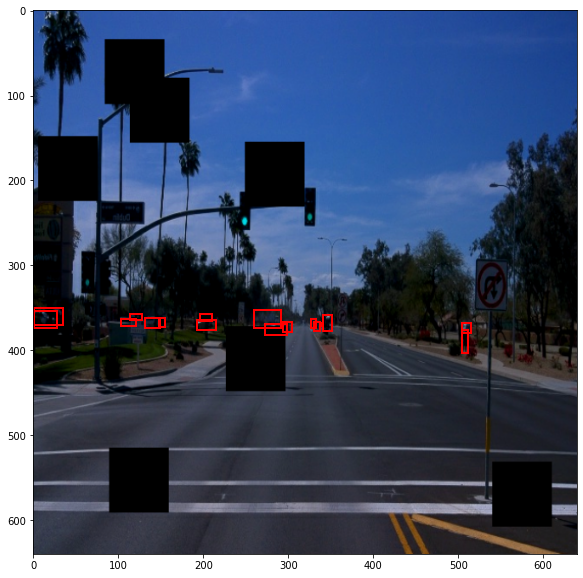

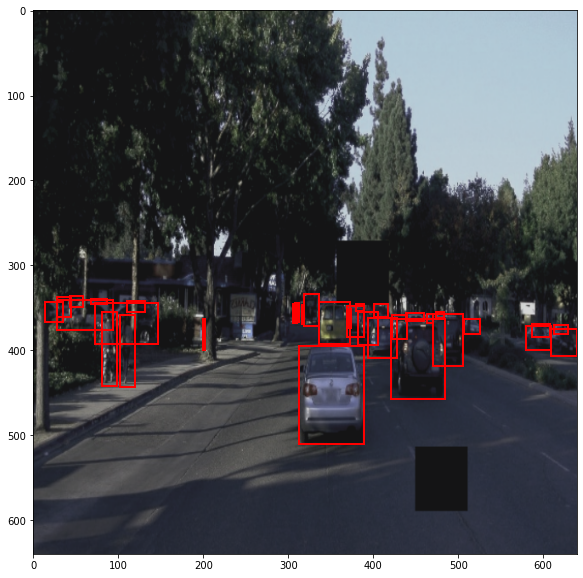

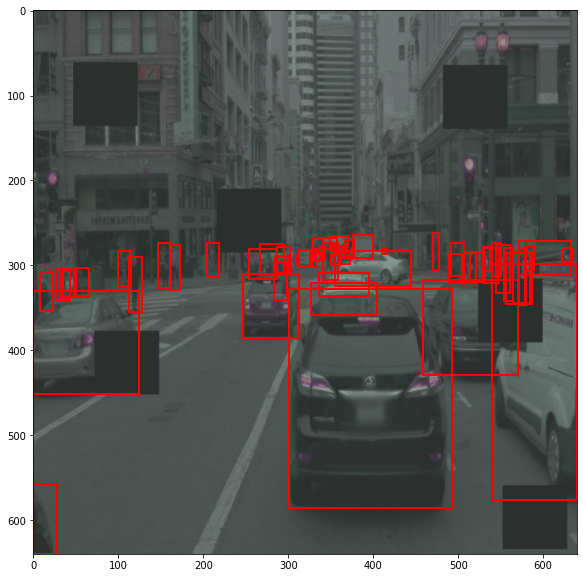

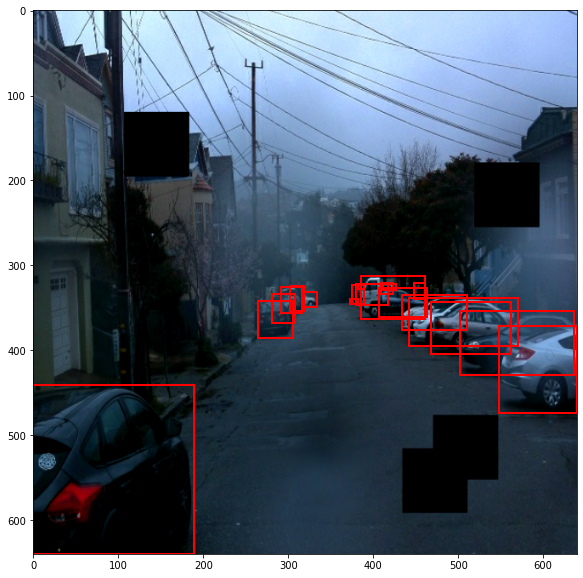

In [15]:
%matplotlib inline

for batch in train_dataset_4.take(10):
    display_batch(batch)